#Extracting License plate for Helmet Violation




Please make a copy of the folder in your work space from the GDrive Link.
[link text](https://drive.google.com/drive/folders/1iqh_2374fjyBnMxlEGtc2NPEFtnaTJvS?usp=drive_link)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/HelmetDetection

/content/drive/MyDrive/HelmetDetection


In [ ]:
#!git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 86353, done.
remote: Counting objects: 100% (107/107), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 86353 (delta 51), reused 80 (delta 36), pack-reused 86246
Receiving objects: 100% (86353/86353), 598.62 MiB | 14.55 MiB/s, done.
Resolving deltas: 100% (61933/61933), done.
Updating files: 100% (3545/3545), done.


In [ ]:
!apt-get update
!apt-get install -y -qq protobuf-compiler python-pil python-lxml

Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:5 http://archive.ubuntu.com/ubuntu focal InRelease
Get:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:8 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [2,866 kB]
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:10 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:11 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:12 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 Packages [1,369 kB]
Hit:13 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Get:14 http://se

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/HelmetDetection/models/research/slim')
!pip install tf_slim

In [ ]:
%cd /content/drive/MyDrive/HelmetDetection/models/research
!protoc object_detection/protos/*.proto --python_out=.

/content/drive/MyDrive/HelmetDetection/models/research


In [ ]:
# Import packages
import os
import cv2
import numpy as np
import tensorflow as tf
import sys
from google.colab.patches import cv2_imshow


# Import utilites
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [ ]:
# !pip install opencv-python
# !pip install tensorflow
# !pip install imutils
# !pip install easyocr

In [ ]:
pwd

'/content/drive/MyDrive/HelmetDetection/models/research'

In [ ]:
CWD_PATH = '/content/drive/MyDrive/HelmetDetection/'

MODEL_RCNN = 'rcnn'

MODEL_YOLO='yolo'

# Path to frozen detection graph .pb file, which contains the model that is used
# for rcnn object detection.
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_RCNN,'frozen_inference_graph.pb')

# Path to label map file
PATH_TO_LABELS = os.path.join(CWD_PATH,MODEL_RCNN,'label_map.pbtxt')

# Path to detect License Plate
CLPath=os.path.join(CWD_PATH,MODEL_YOLO,"yolov3-custom.cfg")
WLPath=os.path.join(CWD_PATH,MODEL_YOLO,"yolov3-custom_7000.weights")
ModelPath=os.path.join(CWD_PATH,MODEL_YOLO,'helmet-nonhelmet_cnn.h5')


# Path to yolo files
configPath=os.path.join(CWD_PATH,MODEL_YOLO,'yolov3_custom.cfg')
weightsPath=os.path.join(CWD_PATH,MODEL_YOLO,'yolov3_custom_4000.weights')
labelsPath=os.path.join(CWD_PATH,MODEL_YOLO,'obj.names')

In [ ]:
# Path to input image
IMAGE_NAME = 'input/images/'

OUTPUT_FOLDER='output/'

# Path to output
PATH_TO_OUTPUT = os.path.join(CWD_PATH, OUTPUT_FOLDER,'/images')

# Path to image
PATH_TO_IMAGE = os.path.join(CWD_PATH,IMAGE_NAME)


In [ ]:
from tensorflow.python.platform import gfile
from tensorflow.core.protobuf import saved_model_pb2
from tensorflow.python.util import compat
# Load the label map.
# Label maps map indices to category names
# Here we use internal utility functions
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=1, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.compat.v1.GraphDef()
    with tf.compat.v2.io.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')
    sess = tf.compat.v1.Session(graph=detection_graph)

# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')

In [ ]:
net = cv2.dnn.readNetFromDarknet(configPath, weightsPath)
ln = net.getLayerNames()
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]
LABELS = open(labelsPath).read().strip().split("\n")

In [ ]:
import imutils
from tensorflow.keras.models import load_model
net1 = cv2.dnn.readNet(WLPath,CLPath)
net1.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
net1.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)
model = load_model(ModelPath)
COLORS = [(0,255,0),(0,0,255)]
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]


In [ ]:
def get_numberPlate(img,count):
    print("called for Number Plate as no Helmet")
    cv2_imshow(img)
    img = imutils.resize(img, height=500)
    height, width = img.shape[:2]
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net1.setInput(blob)
    outs = net1.forward(output_layers)
    confidences = []
    boxes = []
    classIds = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                classIds.append(class_id)
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    for i in range(len(boxes)):
        if i in indexes:
            x,y,w,h = boxes[i]

            color = [int(c) for c in COLORS[classIds[i]]]
            if classIds[i]==0: #bike
                helmet_roi = img[max(0,y):max(0,y)+max(0,h)//1,max(0,x):max(0,x)+max(0,w)]
            else: #number plate
                x_h = x-60
                y_h = y-350
                w_h = w+100
                h_h = h+100
                cv2.rectangle(img, (x, y), (x + w, y + h), color, 7)
                noPlate = img[y:y+h,x:x+w]
                try:
                  cv2.imwrite( f"/content/drive/MyDrive/HelmetDetection/output/images/LPimg{count}.jpg",noPlate)
                  cv2_imshow(noPlate)
                except:
                  pass


called for Number Plate as no Helmet


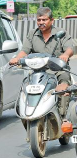

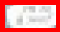

called for Number Plate as no Helmet


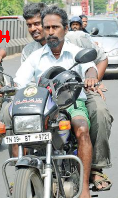

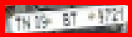

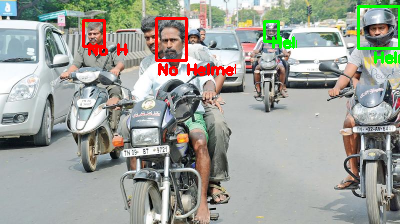

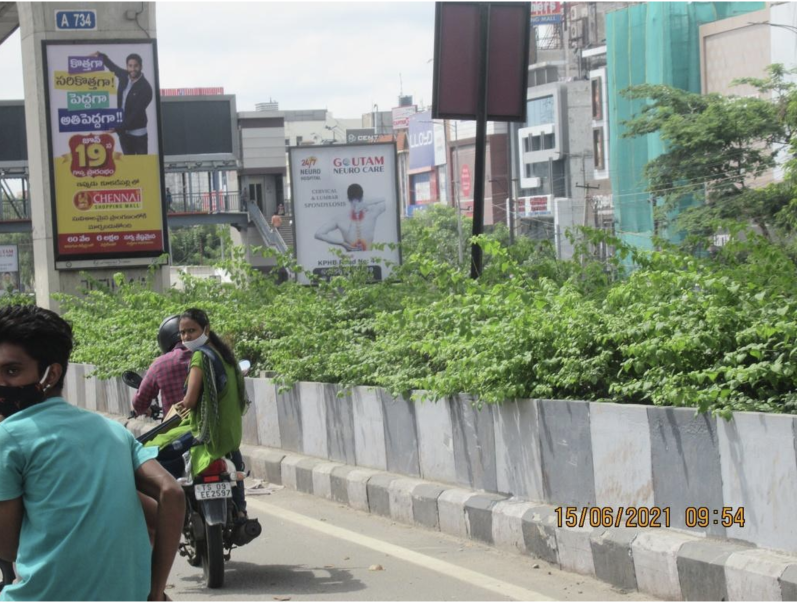

called for Number Plate as no Helmet


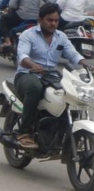

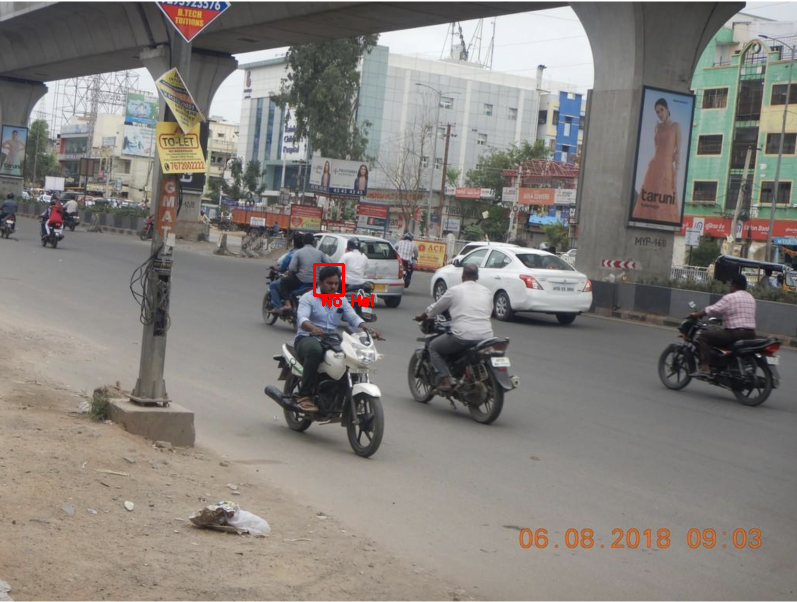

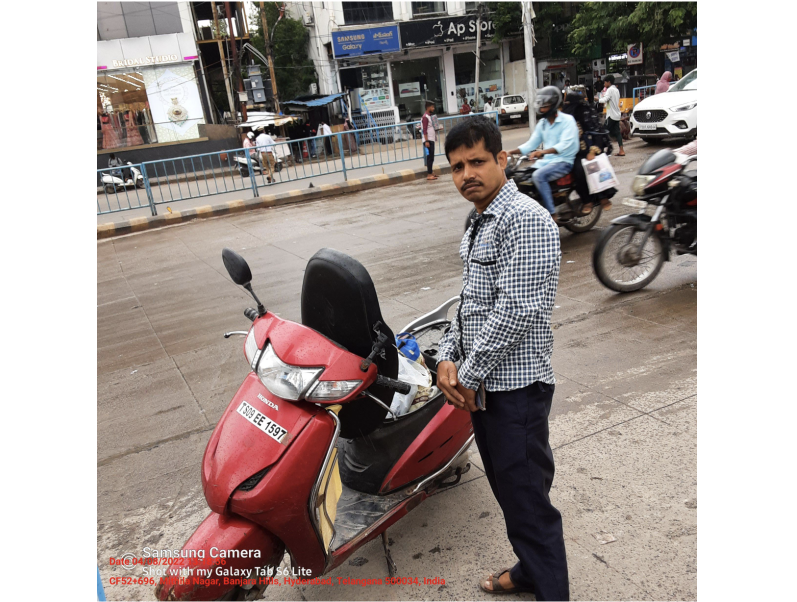

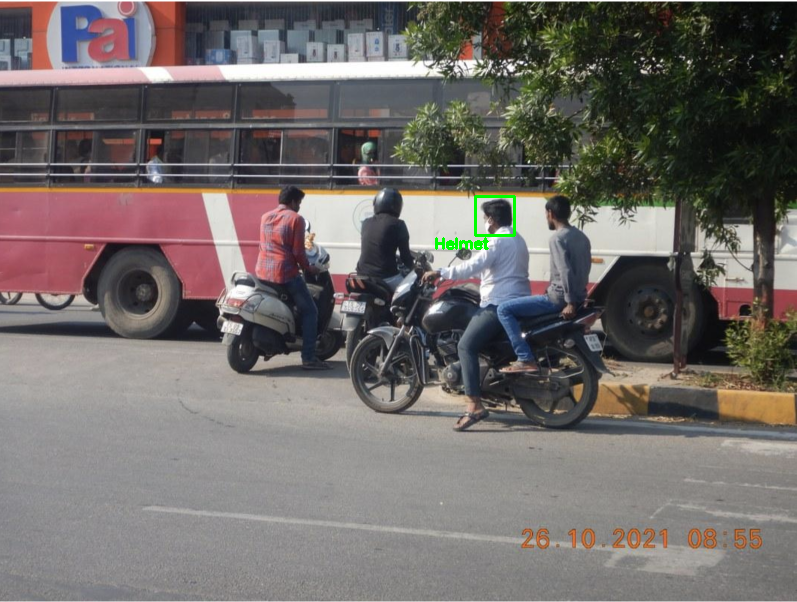

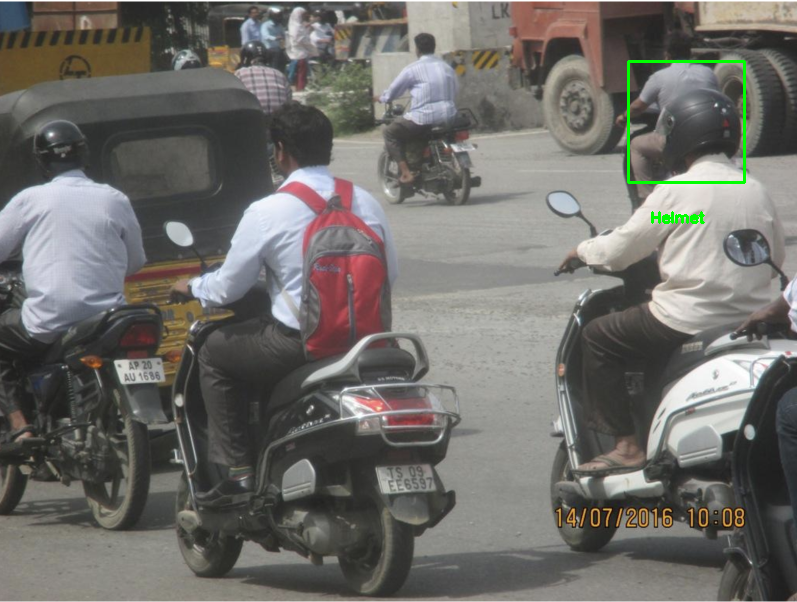

called for Number Plate as no Helmet


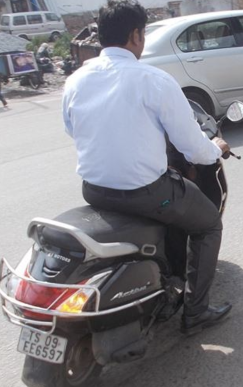

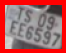

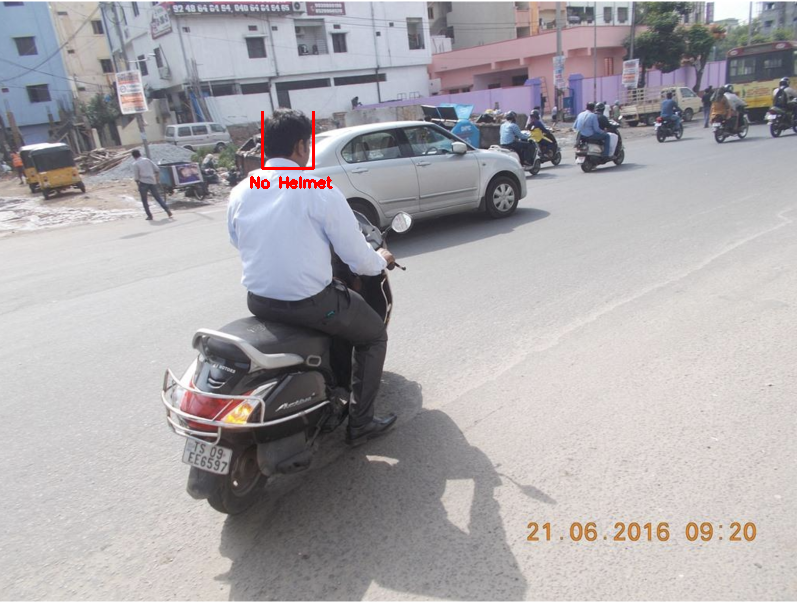

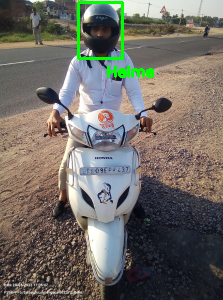

called for Number Plate as no Helmet


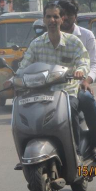

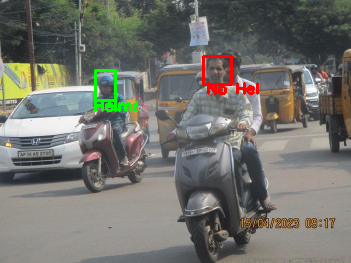

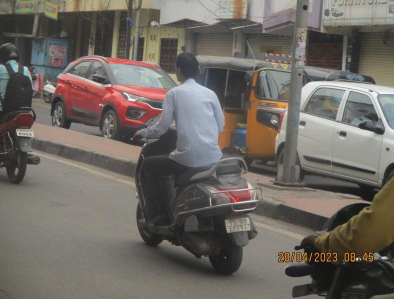

called for Number Plate as no Helmet


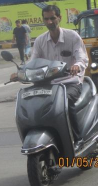

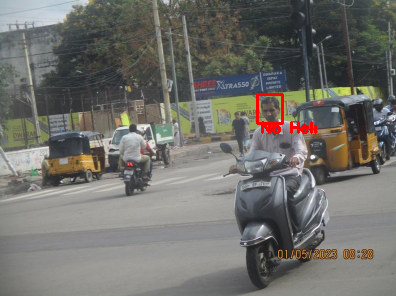

called for Number Plate as no Helmet


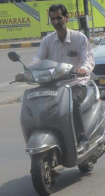

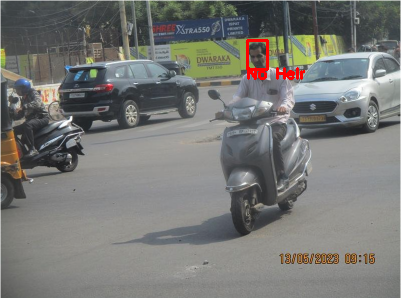

called for Number Plate as no Helmet


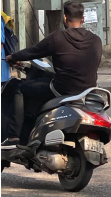

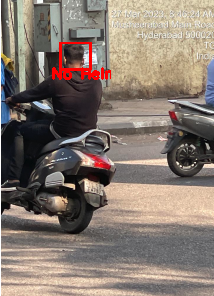

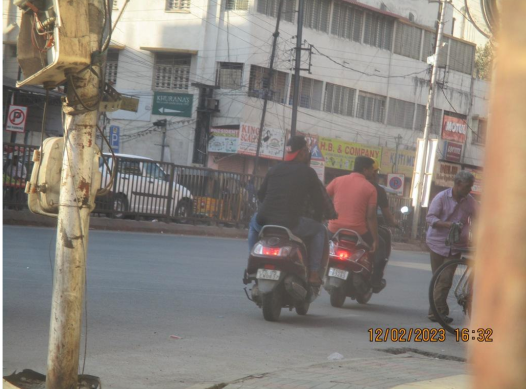

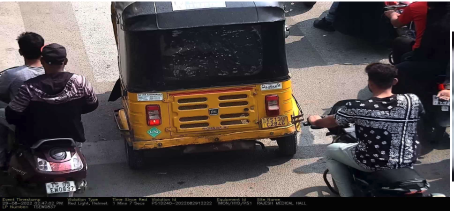

called for Number Plate as no Helmet


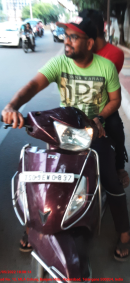

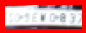

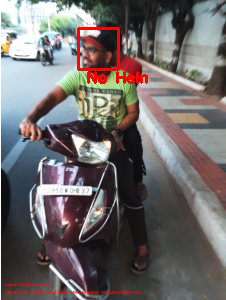

called for Number Plate as no Helmet


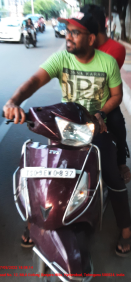

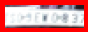

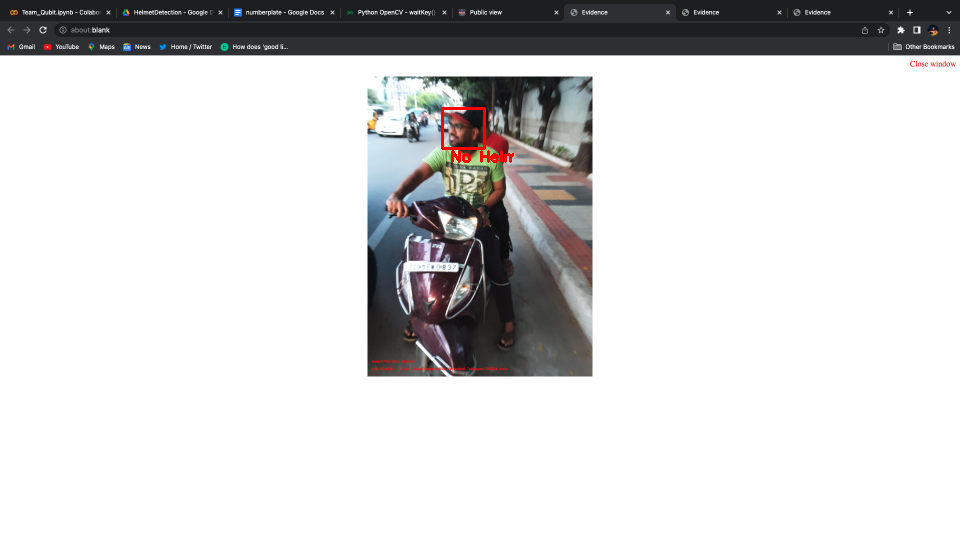

called for Number Plate as no Helmet


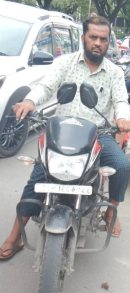

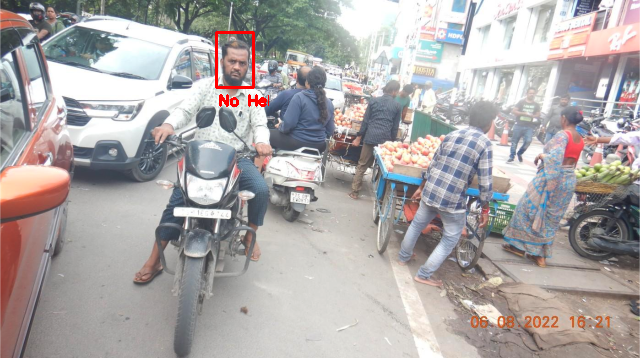

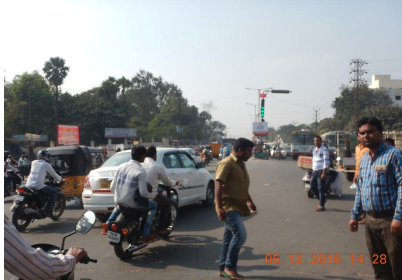

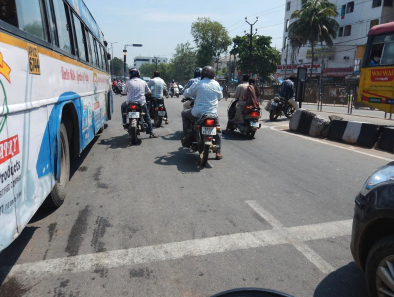

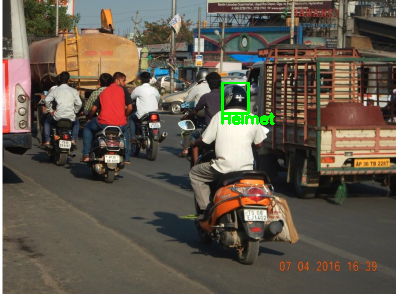

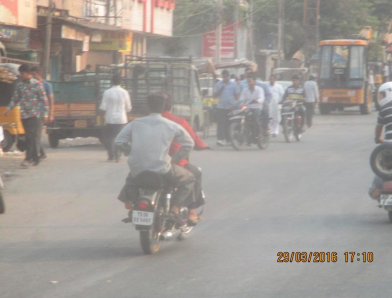

called for Number Plate as no Helmet


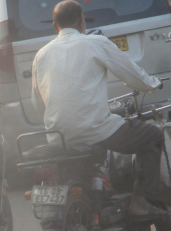

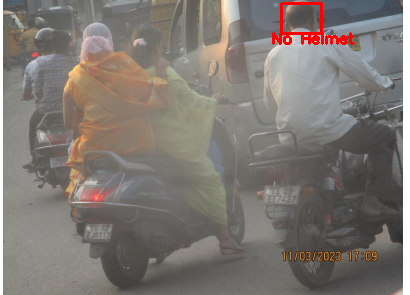

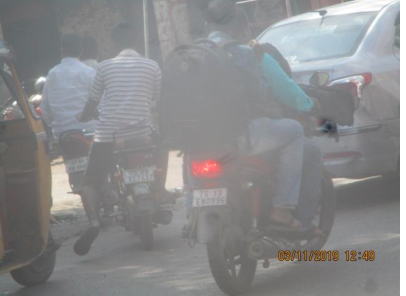

called for Number Plate as no Helmet


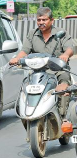

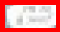

called for Number Plate as no Helmet


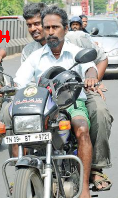

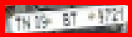

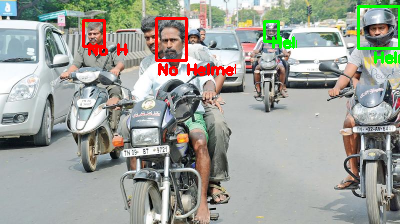

In [ ]:
from IPython.utils import path
imagePath = os.listdir('/content/drive/MyDrive/HelmetDetection/input/images/')
pathCount = len(imagePath)
while(pathCount!=-1):
  pathCount -= 1
  image = cv2.imread(f"/content/drive/MyDrive/HelmetDetection/input/images/{imagePath[pathCount]}")
  image = cv2.resize(image,None,fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

  image_expanded = np.expand_dims(image, axis=0)

  # Perform the actual detection by running the model with the image as input
  (boxes, scores, classes, num) = sess.run(
      [detection_boxes, detection_scores, detection_classes, num_detections],
      feed_dict={image_tensor: image_expanded})

  #getting the normalized coordinates of boxes
  normalizedBoxes = np.squeeze(boxes)
  normalizedScores = np.squeeze(scores)
  normalizedClasses = np.squeeze(classes)

  #set a min thresh score, say 0.8
  min_score_thresh = 0.8
  detectedBoxes = normalizedBoxes[normalizedScores > min_score_thresh]
  detectedClasses = normalizedClasses[normalizedScores > min_score_thresh]

  #get image size
  im_height,im_width, _=image.shape
  size=(im_width, im_height)

  #get  original coordinates of bike riders in image
  final_boxes = []
  for i in range(len(detectedBoxes)):
      ymin, xmin, ymax, xmax = detectedBoxes[i]
      final_boxes.append([xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height])

  j=0
  for [left,right,top,bottom] in final_boxes:

      l=int(round(left))
      r=int(round(right))
      t=int(round(top))
      b=int(round(bottom))
      croppedImage=image[t:b,l:r]  # Extract each bike rider

      #cv2.rectangle(image, (l,t), (r,b), (255,0,0), 2)

      # perform padding to cropped image
      rows = croppedImage.shape[0]
      cols = croppedImage.shape[1]
      padding=0
      if rows > cols:
          padding = int((rows-cols) / 2)
          paddedImg=cv2.copyMakeBorder(croppedImage, 0, 0, padding, padding,  cv2.BORDER_CONSTANT, (0, 0, 0))
      else:
          paddedImg=croppedImage

      # image preprocessing for yolo model
      (H, W) = paddedImg.shape[:2]
      blob = cv2.dnn.blobFromImage(paddedImg, 1 / 255.0, (416, 416), swapRB=True, crop=False)

      # run yolo model
      net.setInput(blob)
      layerOutputs = net.forward(ln)

      # Initializing for getting box coordinates, confidences, classid
      boxesH = []
      confidencesH = []
      classIDsH = []
      thresholdH = 0.15

      # getting coordinates of output predictions and performing NMS
      for output in layerOutputs:
          for detection in output:
              confidenceOfEachClass = detection[5:]
              classIDH = np.argmax(confidenceOfEachClass)    # get class with max confidence
              confidenceH = confidenceOfEachClass[classIDH]  # get the max confidence
              if confidenceH > thresholdH:
                  boxH = detection[0:4] * np.array([W, H, W, H])
                  (centerX, centerY, widthH, heightH) = boxH.astype("int")
                  x = int(centerX - (widthH / 2))
                  y = int(centerY - (heightH / 2))
                  boxesH.append([x, y, int(widthH), int(heightH)])
                  confidencesH.append(float(confidenceH))
                  classIDsH.append(classIDH)
      idxs = cv2.dnn.NMSBoxes(boxesH, confidencesH, thresholdH, 0.1)

      # bounding boxes for helmet- no helmet
      if len(idxs) > 0:
          for i in idxs.flatten():
              (x, y) = (boxesH[i][0], boxesH[i][1])
              (w, h) = (boxesH[i][2], boxesH[i][3])
              if LABELS[classIDsH[i]] == 'Helmet':
                  color = (0, 255, 0)
                  cv2.rectangle(croppedImage, (x-padding, y), (x + w-padding, y + h), color, 2)
                  text = "{}".format(LABELS[classIDsH[i]])
                  cv2.putText(croppedImage, text, (x//2, y+ 4*h//3),
                  cv2.FONT_HERSHEY_SIMPLEX,0.5, color, 2)
              if (LABELS[classIDsH[i]] == 'No Helmet'):
                  # store images with no helmet

                  #name=IMAGE_NAME.split(".")[0].split('/')[-1]
                  j+=1
                  cv2.imwrite(f"/content/drive/MyDrive/HelmetDetection/output/images/img{pathCount}.jpg",croppedImage)
                  get_numberPlate(croppedImage,pathCount)
                  # draw bounding box
                  color = (0, 0, 255)
                  cv2.rectangle(croppedImage, (x-padding, y), (x + w-padding, y + h), color, 2)
                  text = "{}".format(LABELS[classIDsH[i]])
                  cv2.putText(croppedImage, text, (x//2, y + 4* h//3),
                  cv2.FONT_HERSHEY_SIMPLEX,0.5, color, 2)


  cv2_imshow(image)